In [130]:
import pandas as pd
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import plotly.offline as pyo
import quandl
import yfinance as yf
import pylab
import seaborn as sns #built on top of matplotlib and is useful in providing useful interface for showing results
from datetime import datetime #for data retrival of MnC's finances
from pandas_datareader import data 

pd.options.plotting.backend='plotly'
pyo.init_notebook_mode(connected='True')

In [131]:
#Setting the begining and endind dates
today=datetime.now()
year_ago=datetime(today.year-1,today.month,today.day) #starting date= one yr prior to current date


In [132]:
TWTR=pd.read_csv("TWTR.csv")
MET=pd.read_csv("MET.csv")
MSFT=pd.read_csv("MSFT.csv")
AMZN=pd.read_csv("AMZN.csv")
EBAY=pd.read_csv("EBAY.csv")
NFLX=pd.read_csv("NFLX.csv")

#SIX companies choosed for data extraction
company_list=['TWTR','MET','MSFT','AMZN','EBAY','NFLX']

In [133]:
TWTR.head(5)
#fIrst five rows of twitter's finance dataset
#To see how it is structured 

,Date,Low,Open,Volume,High,Close,Adjusted Close
0,07-11-2013,44.000000,45.099998,117701670.0,50.090000,44.900002,44.900002
1,08-11-2013,40.685001,45.930000,27925307.0,46.939999,41.650002,41.650002
2,11-11-2013,39.400002,40.500000,16113941.0,43.000000,42.900002,42.900002
3,12-11-2013,41.830002,43.660000,6316755.0,43.779999,41.900002,41.900002
4,13-11-2013,40.759998,41.029999,8688325.0,42.869999,42.599998,42.599998


In [134]:
MET.head(5)

,Date,Low,Open,Volume,High,Close,Adjusted Close
0,05-04-2000,12.756239,12.923351,77084766,14.037433,13.814617,8.351951
1,06-04-2000,13.591800,13.703209,17167722,14.148841,13.870321,8.385628
2,07-04-2000,13.480392,13.703209,15131516,13.870321,13.647504,8.250919
3,10-04-2000,13.591800,13.758913,6324938,13.814617,13.758913,8.318274
4,11-04-2000,13.424688,13.647504,6087860,13.703209,13.480392,8.149890


In [135]:
MSFT.head(5)

,Date,Low,Open,Volume,High,Close,Adjusted Close
0,13-03-1986,0.088542,0.088542,1031788800,0.101563,0.097222,0.060809
1,14-03-1986,0.097222,0.097222,308160000,0.102431,0.100694,0.062980
2,17-03-1986,0.100694,0.100694,133171200,0.103299,0.102431,0.064067
3,18-03-1986,0.098958,0.102431,67766400,0.103299,0.099826,0.062437
4,19-03-1986,0.097222,0.099826,47894400,0.100694,0.098090,0.061351


In [136]:
AMZN.head(5)

,Date,Low,Open,Volume,High,Close,Adjusted Close
0,15-05-1997,0.096354,0.121875,1443120000,0.125000,0.097917,0.097917
1,16-05-1997,0.085417,0.098438,294000000,0.098958,0.086458,0.086458
2,19-05-1997,0.081250,0.088021,122136000,0.088542,0.085417,0.085417
3,20-05-1997,0.081771,0.086458,109344000,0.087500,0.081771,0.081771
4,21-05-1997,0.068750,0.081771,377064000,0.082292,0.071354,0.071354


In [137]:
EBAY.head(5)

,Date,Low,Open,Volume,High,Close,Adjusted Close
0,24-09-1998,0.775989,0.938201,518656090,0.951354,0.830791,0.783200
1,25-09-1998,0.721188,0.797910,121255834,0.808870,0.786949,0.741870
2,28-09-1998,0.806678,0.832983,89772883,0.892168,0.846135,0.797665
3,29-09-1998,0.837367,0.865863,39289536,0.881208,0.857095,0.807997
4,30-09-1998,0.758453,0.827502,44113766,0.841751,0.790237,0.744969


In [138]:
NFLX.head(5)

,Date,Low,Open,Volume,High,Close,Adjusted Close
0,23-05-2002,1.145714,1.156429,104790000,1.242857,1.196429,1.196429
1,24-05-2002,1.197143,1.214286,11104800,1.225000,1.210000,1.210000
2,28-05-2002,1.157143,1.213571,6609400,1.232143,1.157143,1.157143
3,29-05-2002,1.085714,1.164286,6757800,1.164286,1.103571,1.103571
4,30-05-2002,1.071429,1.107857,10154200,1.107857,1.071429,1.071429


In [139]:
TWTR.info()
#column datatypes, data stored in dataframe, gives a brief summary of the insights

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2289 entries, 0 to 2288
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Date            2289 non-null   object 
 1   Low             2259 non-null   float64
 2   Open            2259 non-null   float64
 3   Volume          2259 non-null   float64
 4   High            2259 non-null   float64
 5   Close           2259 non-null   float64
 6   Adjusted Close  2259 non-null   float64
dtypes: float64(6), object(1)
memory usage: 125.3+ KB


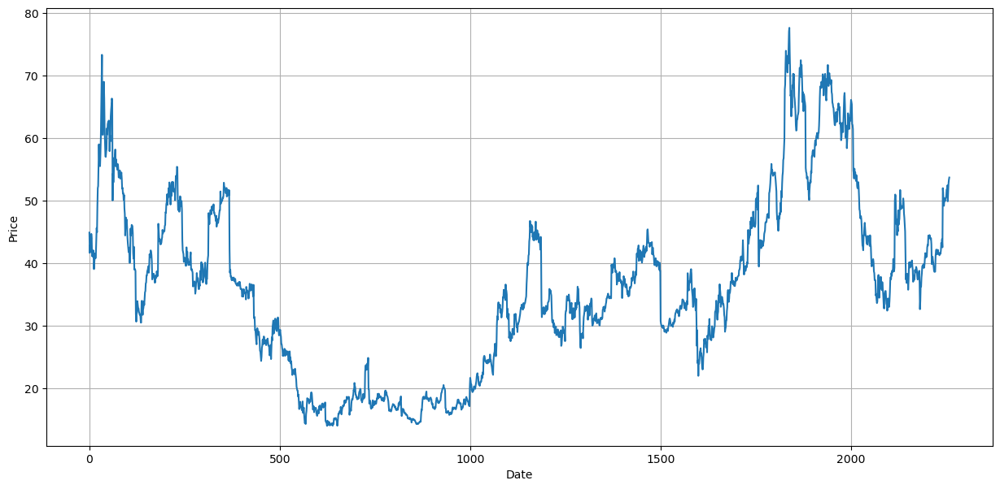

In [140]:
plt.figure(figsize=(15,7))
plt.plot(TWTR['Adjusted Close'])
plt.xlabel('Date')
plt.ylabel('Price')
plt.grid()
plt.show()

In [141]:
print('First',TWTR.Close[0],'End', TWTR.Close[2258]) 
#Here we can see how the prices varied, intial vs closing

First 44.900001525878906 End 53.70000076293945


In [142]:
# We can also compute log returns as its time additive
log_returns=np.log(TWTR.Close/TWTR.Close.shift(1)).dropna()
#we also dropped the nans 
log_returns

1      -0.075136
2       0.029570
3      -0.023586
4       0.016568
5       0.047896
          ...   
2254   -0.049849
2255    0.032150
2256    0.024162
2257    0.010742
2258    0.006539
Name: Close, Length: 2258, dtype: float64

In [143]:
log_returns.mean()

7.926270460146603e-05

In [144]:
TWTR.Close[0]*(np.exp(log_returns.mean()*len(log_returns)))

53.7000007629395

In [145]:
# Lets try to calculate the same using simple returns and see how it compares
simple_returns=TWTR.Close.pct_change().dropna()
# we also dropped the NaNs using dropna()
simple_returns

1      -0.072383
2       0.030012
3      -0.023310
4       0.016706
5       0.049061
          ...   
2284    0.000000
2285    0.000000
2286    0.000000
2287    0.000000
2288    0.000000
Name: Close, Length: 2288, dtype: float64

In [146]:
simple_returns.mean()

0.0006528994280158439

In [147]:
TWTR.Close[0]*(np.prod([(1+Rt) for Rt in simple_returns]))

53.70000076293928

In [148]:
#Histogram of log returns
log_returns.plot(kind='hist')


In [149]:
# lets take the best and the worst case and see the std deviation and the probability of occurances if its assumed to be normal
log_returns_sorted=log_returns.tolist()
log_returns_sorted.sort()
# Here we sorted all the log returns according to their value,
# to get the lowest and the highest case (the leftmost and the Rightmost case in the Histogram)

worst=log_returns_sorted[0]
best=log_returns_sorted[-1]

std_worst=(worst-log_returns.mean())/log_returns.std()
std_best=(best-log_returns.mean())/log_returns.std()
# here we normalise it

print('Std dev. worst %.2f best %.2f' %(std_worst,std_best))

Std dev. worst -8.07 best 7.00


# Testing for normality

Q-Q PLOT


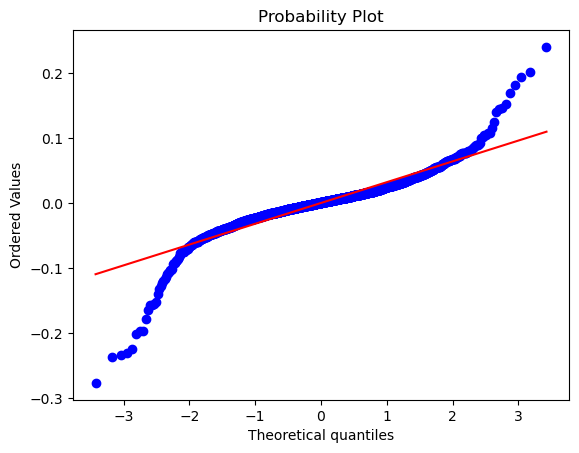

In [150]:
stats.probplot(log_returns, dist='norm', plot=pylab)
print('Q-Q PLOT')

In [151]:
MSFT['Adjusted Close'].plot()


In [152]:
NFLX['Adjusted Close'].plot()

In [153]:
MET['Adjusted Close'].plot()

In [154]:
EBAY['Adjusted Close'].plot()

We then incorporate moving averages to eliminate fluctuations and this process is called smoothing of time series. It reduces the amount of variations present in the data. The main advantage of SMA is that it offers a smoothed line, less prone to whipsawing. Its often favoured by traders operating on longer time frames such as daily or weekly charts

In [155]:
#Number of days for which moving average will be calculated
MA_days = [10, 20, 30]

for ma in MA_days:
    ma_str = "MA: {}".format(ma)
    TWTR[ma_str] = TWTR['Adjusted Close'].rolling(ma).mean()
    MET[ma_str] = MET['Adjusted Close'].rolling(ma).mean()
    MSFT[ma_str] = MSFT['Adjusted Close'].rolling(ma).mean()
    AMZN[ma_str] = AMZN['Adjusted Close'].rolling(ma).mean()
    NFLX[ma_str] = NFLX['Adjusted Close'].rolling(ma).mean()
    EBAY[ma_str] = EBAY['Adjusted Close'].rolling(ma).mean()

In [156]:
def plot_graphic(company, company_string):
    plt.figure(figsize=(15, 6))
    plt.plot(company['Adjusted Close'])
    plt.plot(company['MA: 10'])
    plt.plot(company['MA: 20'])
    plt.plot(company['MA: 30'])
    
    plt.title(company_string)
    plt.xlabel('Date')
    plt.ylabel('Price')

    plt.legend(('Adjusted Close','MA: 10', 'MA: 20', 'MA:30'))
    plt.grid()
    plt.show()

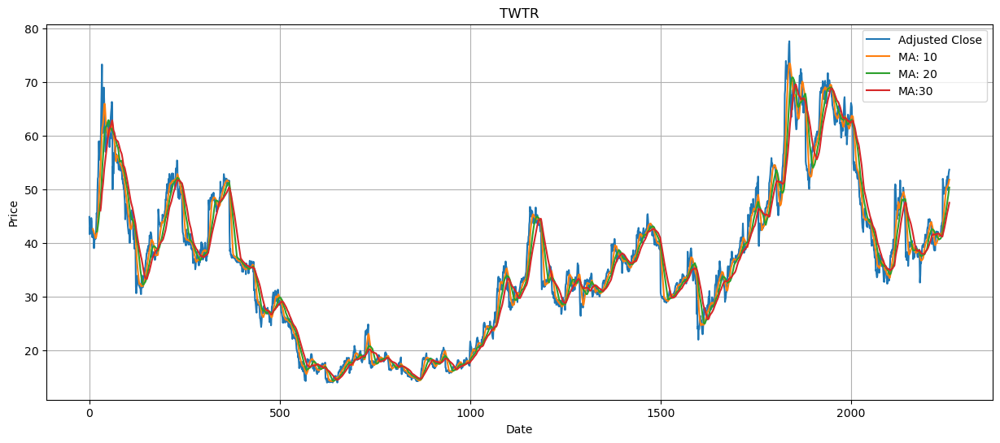

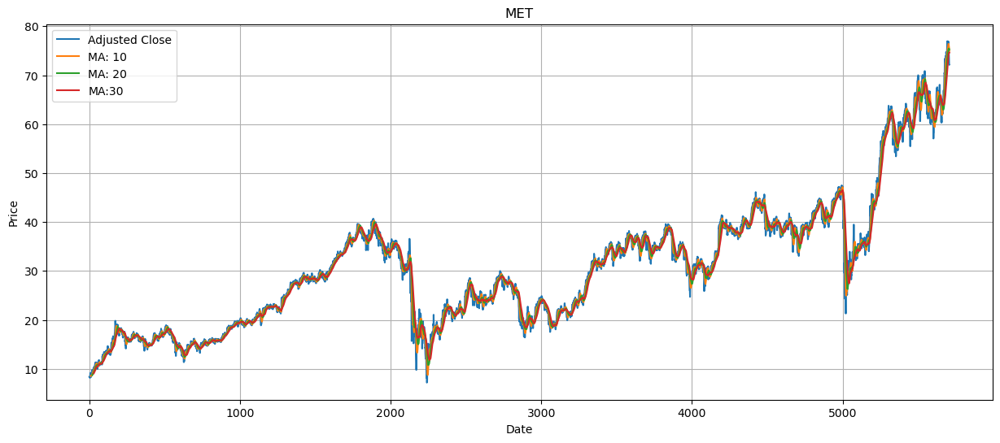

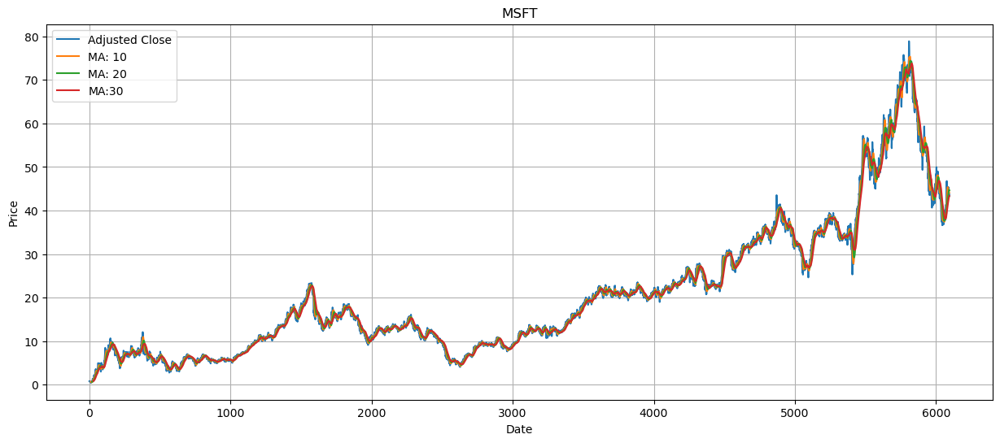

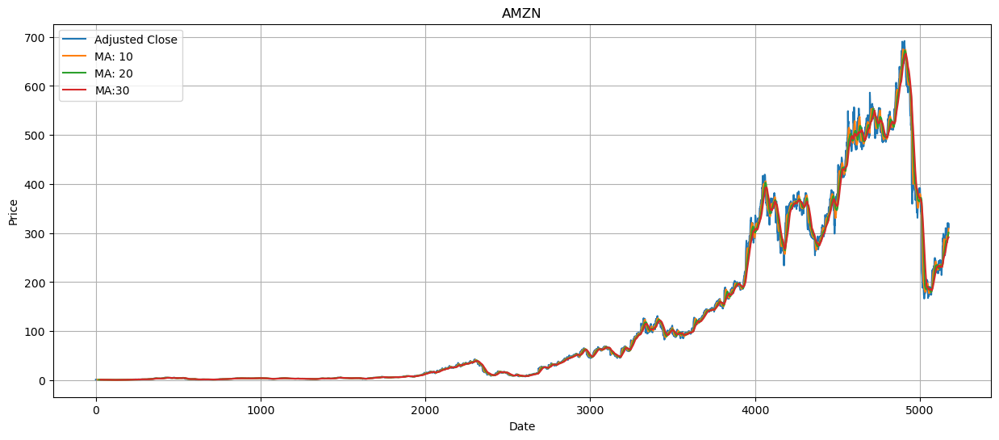

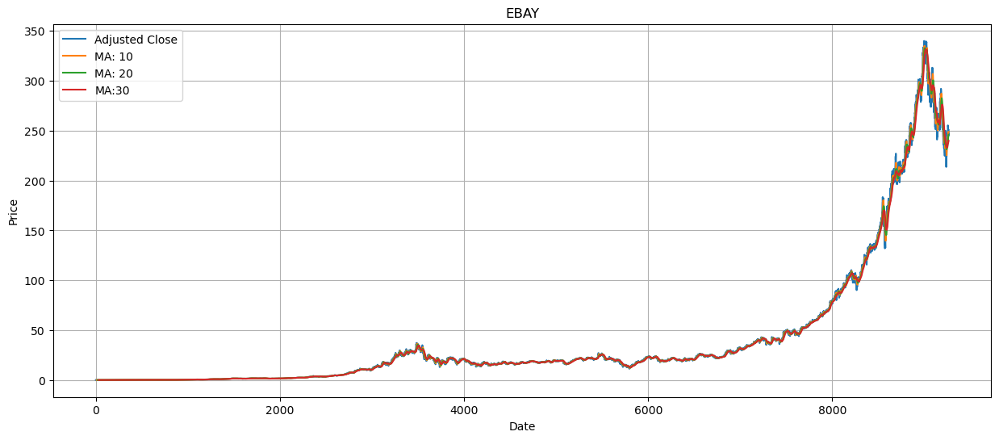

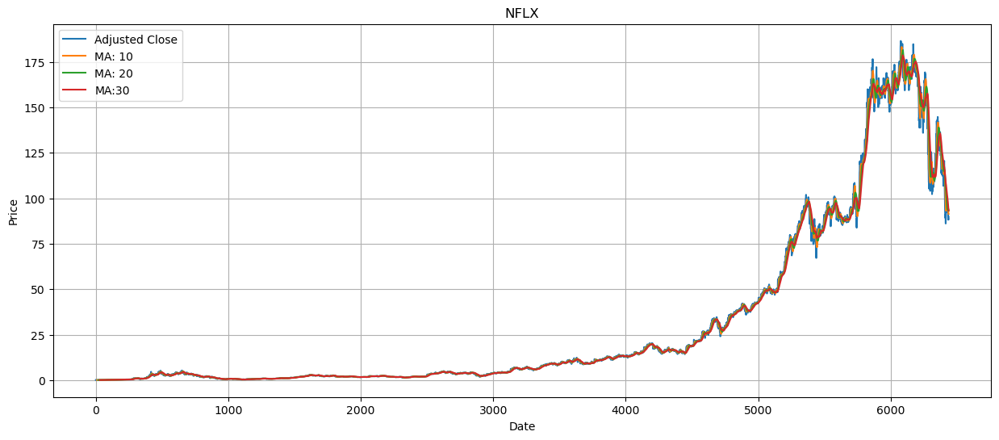

In [157]:
data_list = [ TWTR,MET, EBAY,NFLX, MSFT, AMZN]

for i in range(len(data_list)):   
    plot_graphic(data_list[i], company_list[i])

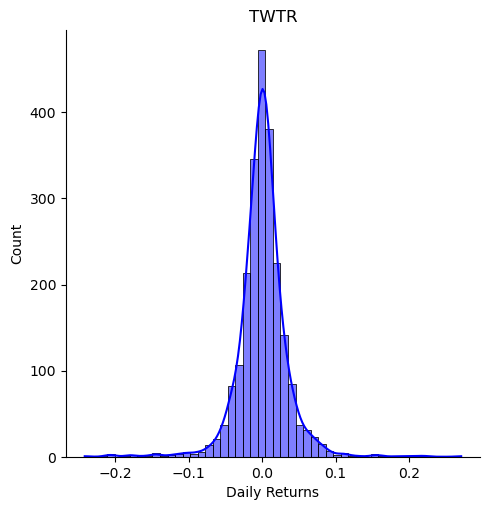

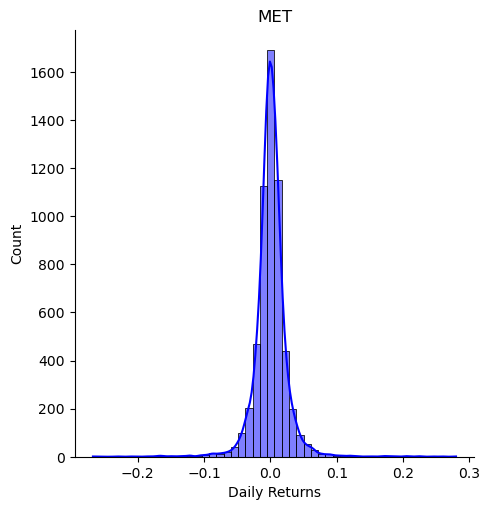

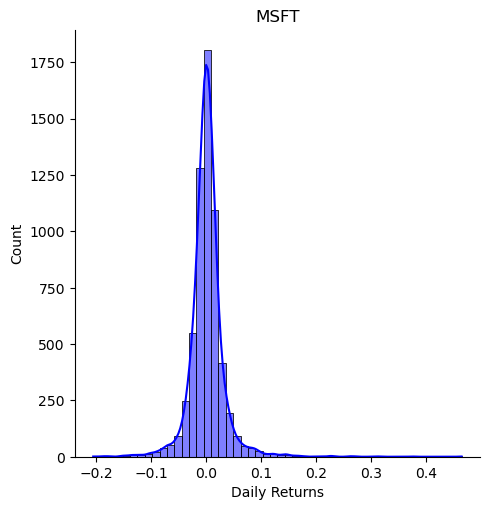

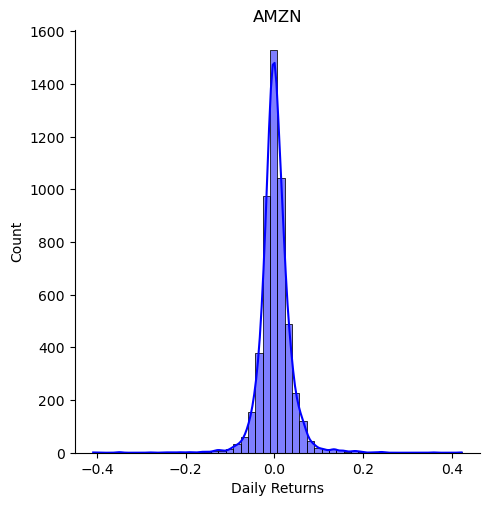

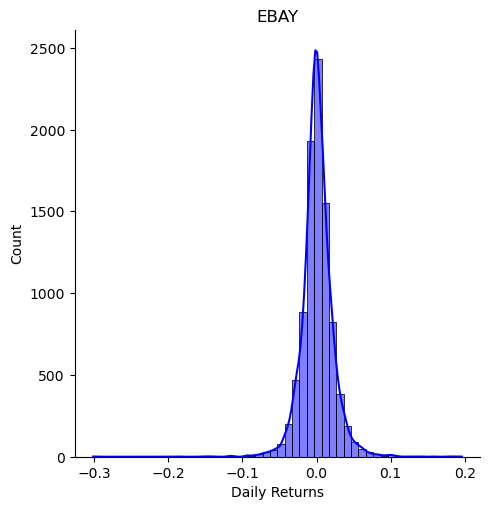

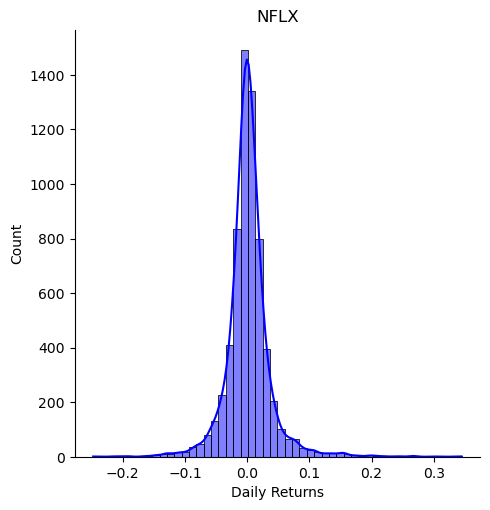

In [158]:
# Calculate returns and draw distribution

for i in range(len(data_list)):
    data_list[i]['Daily Returns'] = data_list[i]['Adjusted Close'].pct_change()
    sns.displot(data_list[i]['Daily Returns'].dropna(), bins=50, color='blue', kde=True)
    plt.title(company_list[i])
    plt.show()

In [159]:
import pandas as pd

# Assuming data_list is a list of dictionaries with 'Daily Returns' as a key and the values are pandas Series
daily_returns_list = [data['Daily Returns'] for data in data_list]

# Concatenate the daily return series along the columns axis
stock_returns = pd.concat(daily_returns_list, axis=1)

# Set the columns names to match the company_list
stock_returns.columns = company_list

# Display the first few rows of the resulting DataFrame
stock_returns.head()

,TWTR,MET,MSFT,AMZN,EBAY,NFLX
0,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.072383,0.004032,-0.052771,0.011343,0.035712,-0.117028
2,0.030012,-0.016064,0.075209,-0.043684,0.017250,-0.012040
3,-0.023310,0.008163,0.012953,-0.046297,-0.025432,-0.042685
4,0.016706,-0.020243,-0.078005,-0.029125,-0.017390,-0.127392


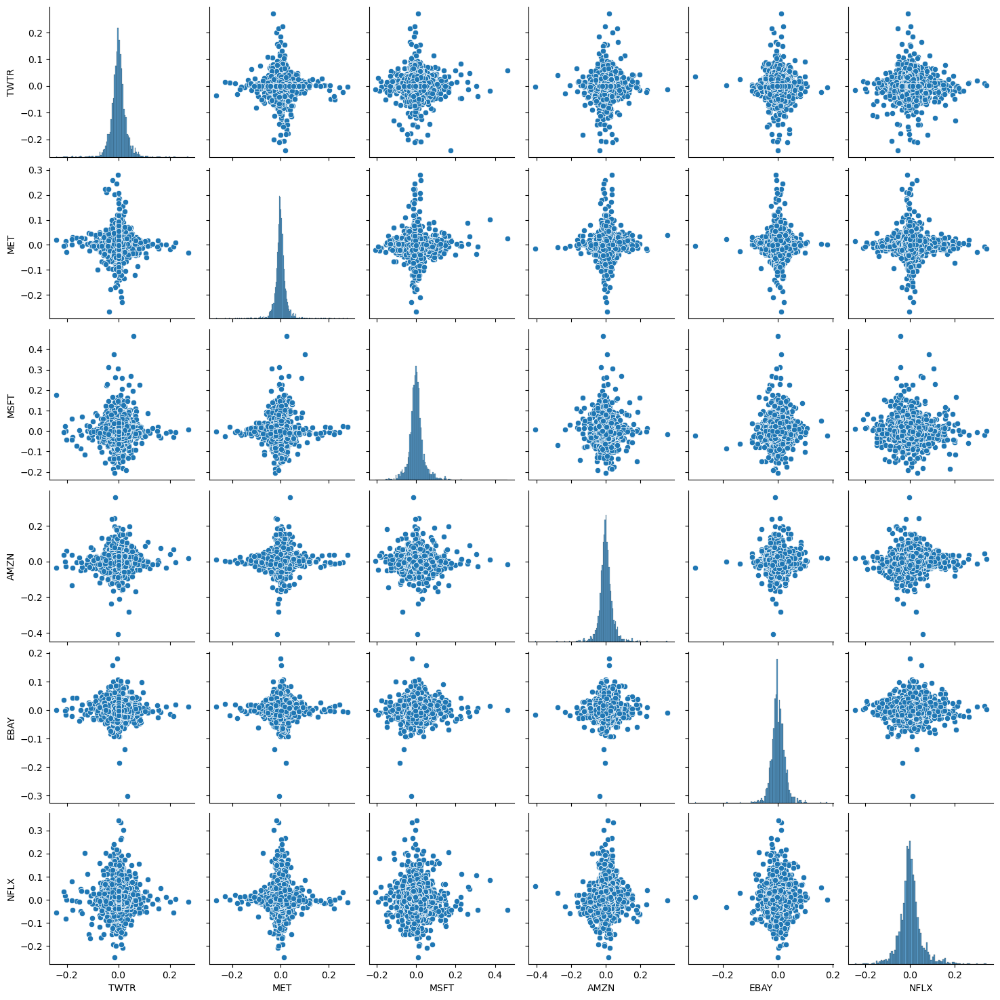

In [160]:
sns.pairplot(stock_returns.dropna())


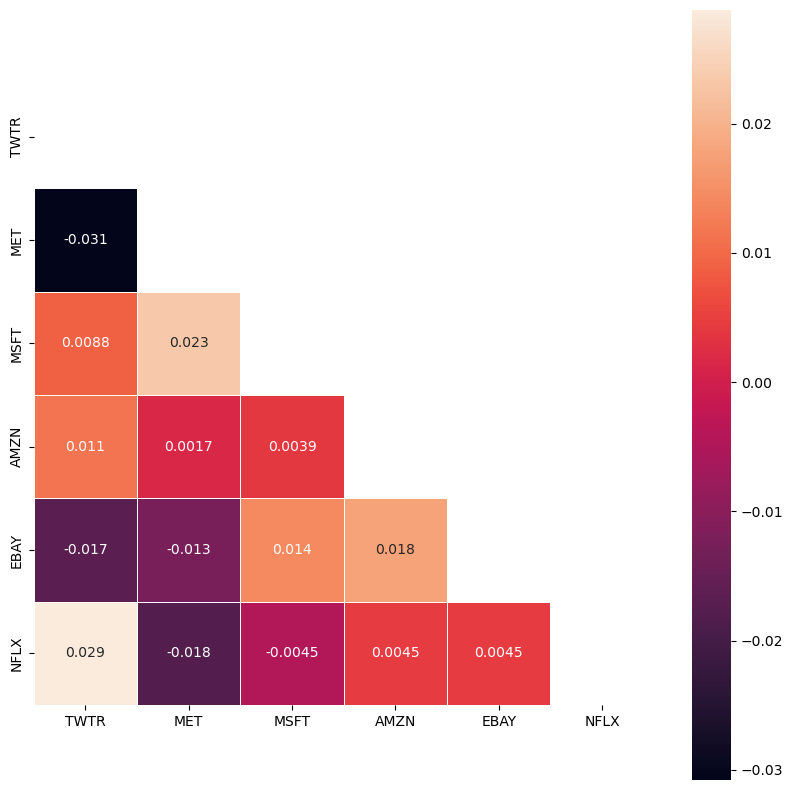

In [161]:
# Build correlation matrix
corr = stock_returns.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
plt.figure(figsize=(10, 10))
sns.heatmap(corr, mask=mask,  square=True, linewidths=.5, annot=True)
plt.show()

In [164]:
mean_income = stock_returns.mean() # Mean income for each stock
cov_returns = stock_returns.cov() # Covariation 
count = len(stock_returns.columns)
print(mean_income, cov_returns, sep='\n')

TWTR    0.000653
MET     0.000703
MSFT    0.001160
AMZN    0.001730
EBAY    0.001128
NFLX    0.001701
dtype: float64
          TWTR       MET      MSFT      AMZN      EBAY      NFLX
TWTR  0.001138 -0.000033  0.000013  0.000015 -0.000014  0.000049
MET  -0.000033  0.000650  0.000019  0.000002 -0.000007 -0.000017
MSFT  0.000013  0.000019  0.001031  0.000005  0.000011 -0.000005
AMZN  0.000015  0.000002  0.000005  0.001295  0.000015  0.000006
EBAY -0.000014 -0.000007  0.000011  0.000015  0.000455  0.000004
NFLX  0.000049 -0.000017 -0.000005  0.000006  0.000004  0.001311


In [165]:
# Function, that generate random shares
def randomPortfolio():
    share = np.exp(np.random.randn(count))
    share = share / share.sum()
    return share

In [166]:
def IncomePortfolio(Rand):
    return np.matmul(mean_income.values, Rand)


def RiskPortfolio(Rand):
    return np.sqrt(np.matmul(np.matmul(Rand, cov_returns.values), Rand))

In [167]:
combinations = 10000
risk = np.zeros(combinations)
income = np.zeros(combinations)
portfolio = np.zeros((combinations, count))

# Function, which create new combinations of shares
for i in range(combinations):
    rand = randomPortfolio()

    portfolio[i, :] = rand
    risk[i] = RiskPortfolio(rand)
    income[i] = IncomePortfolio(rand)

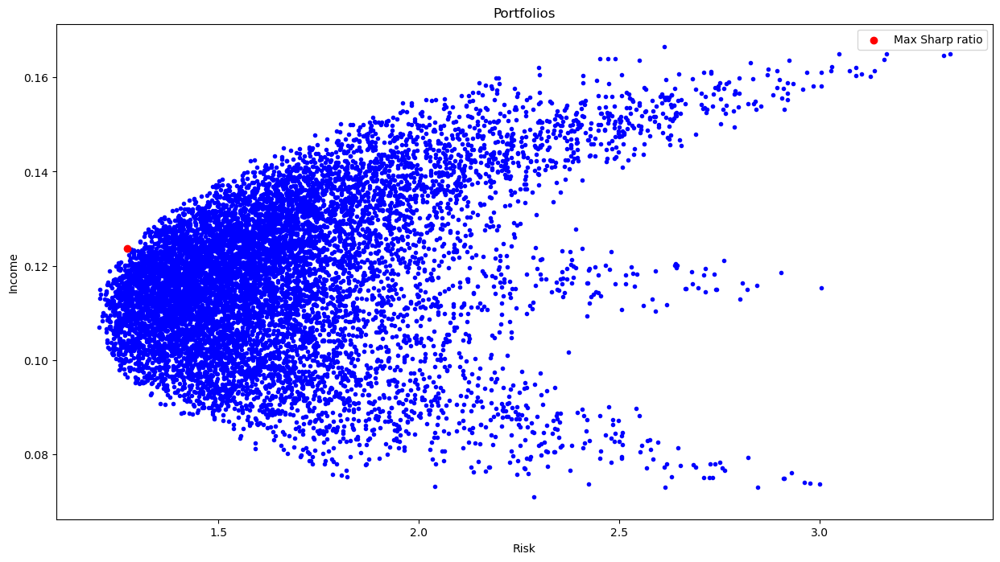

In [168]:
plt.figure(figsize=(15, 8))

plt.scatter(risk * 100, income * 100, c="b", marker=".")
plt.xlabel("Risk")
plt.ylabel("Income")
plt.title("Portfolios")
MaxSharpRatio = np.argmax(income / risk)
plt.scatter([risk[MaxSharpRatio] * 100], [income[MaxSharpRatio] * 100], c="r", marker="o", label="Max Sharp ratio")

plt.legend()
plt.show()

In [169]:
best_port = portfolio[MaxSharpRatio]
for i in range(len(company_list)):
    print("{} : {}".format(company_list[i], best_port[i]))

TWTR : 0.09421099274093087
MET : 0.11835145975660954
MSFT : 0.12276042643875588
AMZN : 0.16256342310905778
EBAY : 0.32309664747213723
NFLX : 0.1790170504825088


In [170]:
days = 365
dt = 1 / days
# here I have divided by 365 but usually we do by 252 (the number of trading days)
stock_returns.dropna(inplace=True)

mu = stock_returns.mean()
sigma = stock_returns.std()

In [171]:
def monte_carlo(start_price, days, mu, sigma):
    price = np.zeros(days)
    price[0] = start_price
    
    shock = np.zeros(days)
    drift = np.zeros(days)
    
    for x in range(1, days):
        shock[x] = np.random.normal(loc=mu * dt, scale=sigma*np.sqrt(dt))
        drift[x] = mu * dt
        
        price[x] = price[x-1] + (price[x-1] * (drift[x] + shock[x]))
        
    return price

IndexError: index 1000 is out of bounds for axis 0 with size 1000

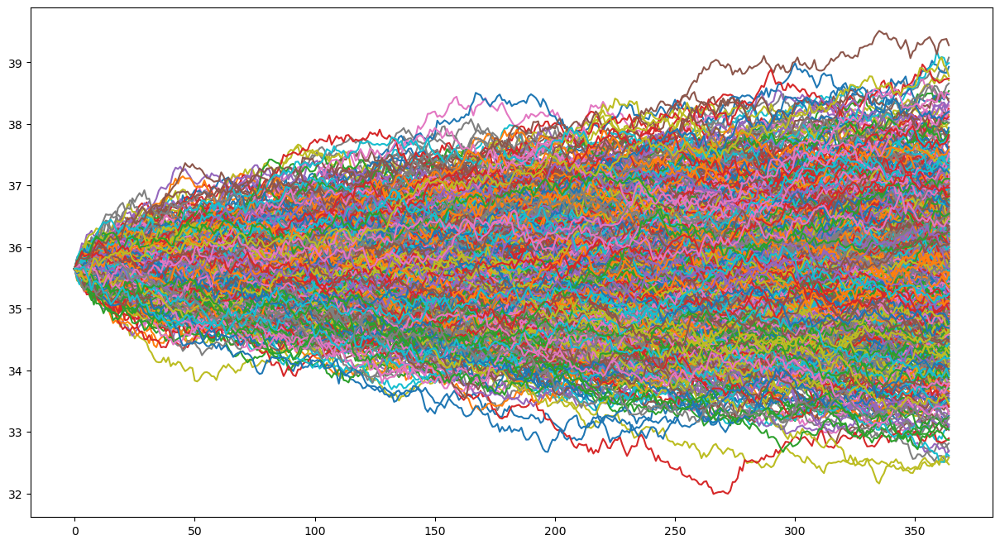

In [172]:
start_price = 35.65
sim = np.zeros(1000)

plt.figure(figsize=(15, 8))
for i in range(10000):
    result = monte_carlo(start_price, days, mu['TWTR'], sigma['TWTR'])
    sim[i] = result[days - 1]
    plt.plot(result)
    
plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for Twitter')


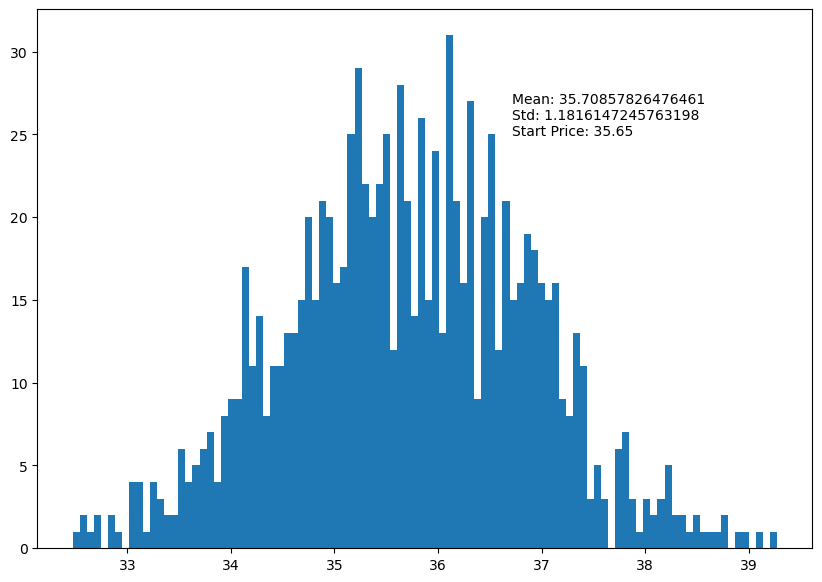

In [173]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()

Text(0.5, 1.0, 'Monte Carlo analysis for EBAY')

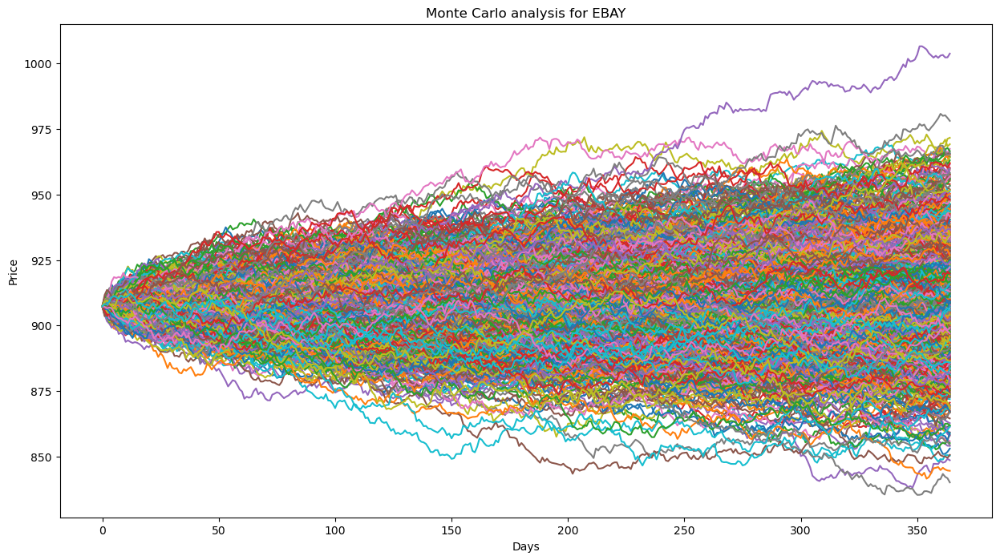

In [174]:
start_price = 907.34
sim = np.zeros(1000)

plt.figure(figsize=(15, 8))
for i in range(1000):
    result = monte_carlo(start_price, days, mu['EBAY'], sigma['EBAY'])
    sim[i] = result[days - 1]
    plt.plot(result)
    
plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for EBAY')


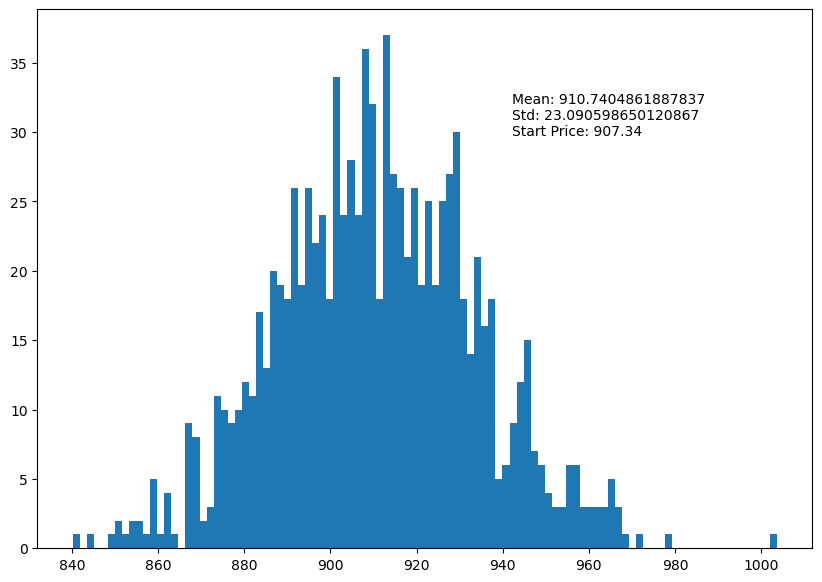

In [179]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()

Text(0.5, 1.0, 'Monte Carlo analysis for Microsoft')

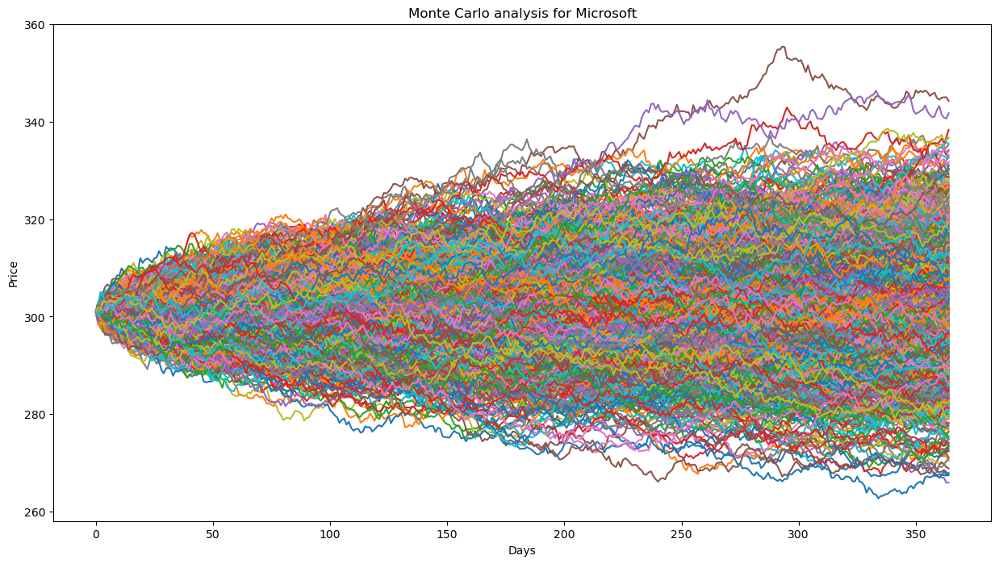

In [180]:
start_price = 300.95
sim = np.zeros(1000)

plt.figure(figsize=(15, 8))
for i in range(1000):
    result = monte_carlo(start_price, days, mu['MSFT'], sigma['MSFT'])
    sim[i] = result[days - 1]
    plt.plot(result)
    
plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for Microsoft')

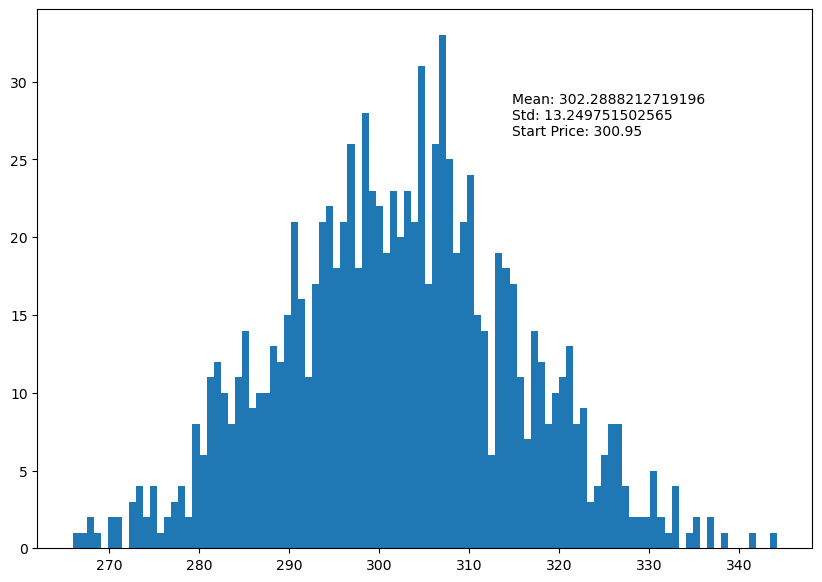

In [181]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()

Text(0.5, 1.0, 'Monte Carlo analysis for Amazon')

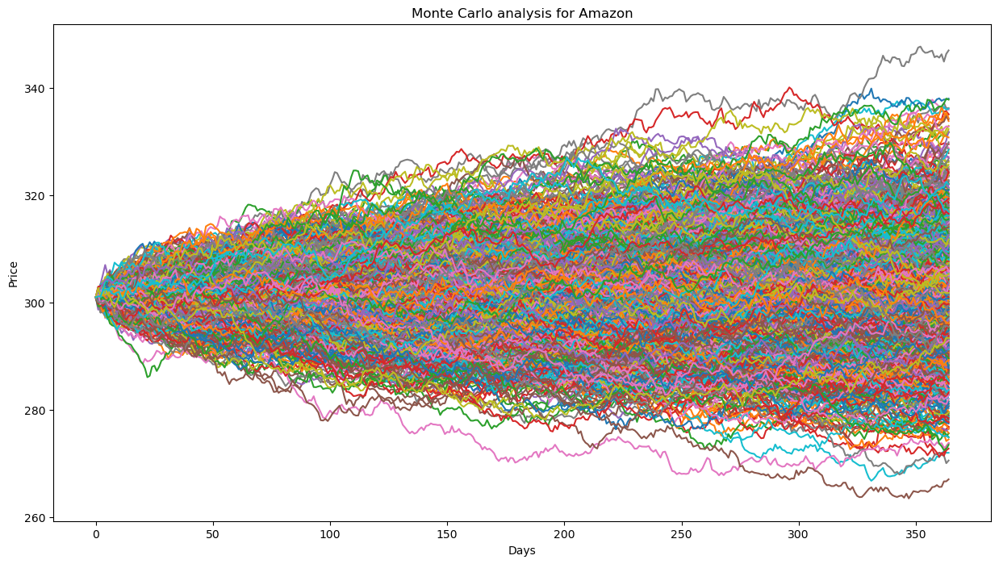

In [182]:
start_price = 300.95
sim = np.zeros(1000)

plt.figure(figsize=(15, 8))
for i in range(1000):
    result = monte_carlo(start_price, days, mu['AMZN'], sigma['AMZN'])
    sim[i] = result[days - 1]
    plt.plot(result)
    
plt.xlabel('Days')
plt.ylabel('Price')
plt.title('Monte Carlo analysis for Amazon')

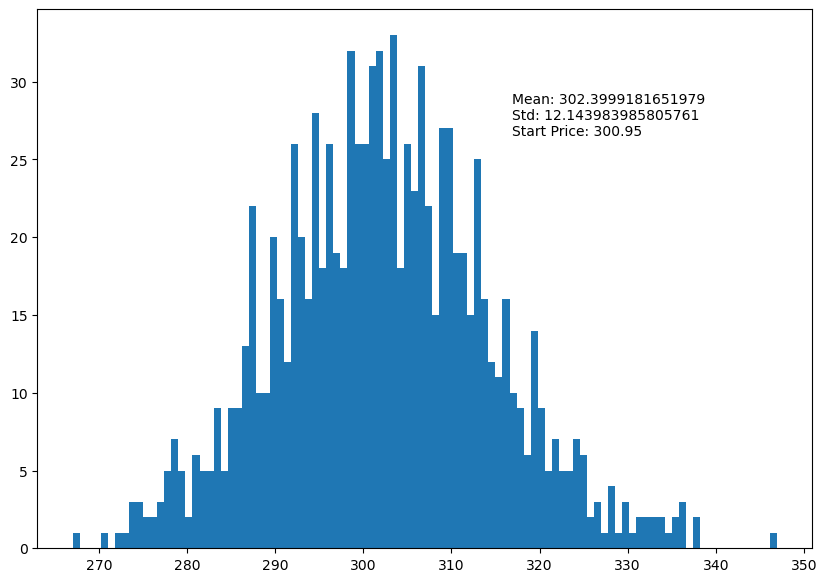

In [183]:
plt.figure(figsize=(10, 7))
plt.hist(sim, bins=100)
plt.figtext(0.6, 0.7, "Mean: {} \nStd: {} \nStart Price: {}".format(sim.mean(), sim.std(), start_price))
plt.show()

In [184]:
# lets import more data
df = yf.download(['AAPL', 'NKE', 'GOOGL', 'AMZN'], start='2015-01-01', end='2019-12-31')
df.head()

[*********************100%%**********************]  4 of 4 completed


Adj Close                                     Close           \
                 AAPL     AMZN      GOOGL        NKE       AAPL     AMZN   
Date                                                                       
2015-01-02  24.498680  15.4260  26.477501  43.225178  27.332500  15.4260   
2015-01-05  23.808517  15.1095  25.973000  42.529240  26.562500  15.1095   
2015-01-06  23.810755  14.7645  25.332001  42.279072  26.565001  14.7645   
2015-01-07  24.144642  14.9210  25.257500  43.152390  26.937500  14.9210   
2015-01-08  25.072321  15.0230  25.345501  44.148537  27.972500  15.0230   

                                       High           ...        Low  \
                GOOGL        NKE       AAPL     AMZN  ...      GOOGL   
Date                                                  ...              
2015-01-02  26.477501  47.514999  27.860001  15.7375  ...  26.393999   
2015-01-05  25.973000  46.750000  27.162500  15.4190  ...  25.887501   
2015-01-06  25.332001  46.474998  26.857500  15.1500  ...  25.277500   
2015-01-07  25.257500  47.435001  27.049999  15.0640  ...  25.182501   
2015-01-08  25.345501  48.529999  28.037500  15.1570  ...  24.750999   

                            Open                                    Volume  \
                  NKE       AAPL     AMZN      GOOGL        NKE       AAPL   
Date                                                                         
2015-01-02  47.055000  27.847500  15.6290  26.629999  48.275002  212818400   
2015-01-05  46.564999  27.072500  15.3505  26.357500  47.255001  257142000   
2015-01-06  46.035000  26.635000  15.1120  26.025000  46.945000  263188400   
2015-01-07  46.549999  26.799999  14.8750  25.547501  46.805000  160423600   
2015-01-08  47.810001  27.307501  15.0160  25.075500  47.830002  237458000   

                                         
                AMZN     GOOGL      NKE  
Date                                     
2015-01-02  55664000  26480000  4985800  
2015-01-05  55484000  41182000  6889200  
2015-01-06  70380000  54456000  7576000  
2015-01-07  52806000  46918000  7256000  
2015-01-08  61768000  73054000  5978200  

[5 rows x 24 columns]

In [185]:
# Closing price
df = df['Adj Close']
df.head()

,AAPL,AMZN,GOOGL,NKE
Date,,,,
2015-01-02,24.498680,15.4260,26.477501,43.225178
2015-01-05,23.808517,15.1095,25.973000,42.529240
2015-01-06,23.810755,14.7645,25.332001,42.279072
2015-01-07,24.144642,14.9210,25.257500,43.152390
2015-01-08,25.072321,15.0230,25.345501,44.148537


In [186]:
# Log of percentage change
cov_matrix = df.pct_change().apply(lambda x: np.log(1+x)).cov()
cov_matrix

,AAPL,AMZN,GOOGL,NKE
AAPL,0.000246,0.000142,0.000122,0.000084
AMZN,0.000142,0.000334,0.000176,0.000092
GOOGL,0.000122,0.000176,0.000222,0.000085
NKE,0.000084,0.000092,0.000085,0.000219


In [187]:
# Yearly returns for individual companies
ind_er = df.resample('Y').last().pct_change().mean()
ind_er

AAPL     0.357854
AMZN     0.295745
GOOGL    0.155478
NKE      0.160666
dtype: float64

In [188]:
# Volatility is given by the annual standard deviation. We multiply by 250 because there are 250 trading days/year.
ann_sd = df.pct_change().apply(lambda x: np.log(1+x)).std().apply(lambda x: x*np.sqrt(250))
ann_sd


AAPL     0.247871
AMZN     0.288770
GOOGL    0.235375
NKE      0.233916
dtype: float64

In [189]:
assets = pd.concat([ind_er, ann_sd], axis=1) # Creating a table for visualising returns and volatility of assets
assets.columns = ['Returns', 'Volatility']
assets

,Returns,Volatility
AAPL,0.357854,0.247871
AMZN,0.295745,0.288770
GOOGL,0.155478,0.235375
NKE,0.160666,0.233916


In [195]:
p_ret = [] # Define an empty array for portfolio returns
p_vol = [] # Define an empty array for portfolio volatility
p_weights = [] # Define an empty array for asset weights

num_assets = len(df.columns)
num_portfolios = 10000

In [196]:
for portfolio in range(num_portfolios):
    weights = np.random.random(num_assets)
    weights = weights/np.sum(weights)
    p_weights.append(weights)
    returns = np.dot(weights, ind_er) # Returns are the product of individual expected returns of asset and its 
                                      # weights 
    p_ret.append(returns)
    var = cov_matrix.mul(weights, axis=0).mul(weights, axis=1).sum().sum()# Portfolio Variance
    sd = np.sqrt(var) # Daily standard deviation
    ann_sd = sd*np.sqrt(250) # Annual standard deviation = volatility
    p_vol.append(ann_sd)

In [197]:
data = {'Returns':p_ret, 'Volatility':p_vol}

for counter, symbol in enumerate(df.columns.tolist()):
    #print(counter, symbol)
    data[symbol+' weight'] = [w[counter] for w in p_weights]

In [198]:
po-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------                           
portfolios.head() # Dataframe of the 100000 portfolios created

,Returns,Volatility,AAPL weight,AMZN weight,GOOGL weight,NKE weight
0,0.233882,0.200596,0.142864,0.343262,0.254882,0.258992
1,0.210969,0.190450,0.138952,0.181584,0.313098,0.366367
2,0.223053,0.187068,0.313108,0.016607,0.307785,0.362501
3,0.254050,0.193420,0.427602,0.068667,0.040378,0.463353
4,0.293442,0.235887,0.260769,0.606718,0.115565,0.016948


In [201]:
# Plot efficient frontier
portfolios.plot.scatter(x='Volatility', y='Returns')

In [202]:
min_vol_port = portfolios.iloc[portfolios['Volatility'].idxmin()]
# idxmin() gives us the minimum value in the column specified.                               
min_vol_port

Returns         0.211624
Volatility      0.186612
AAPL weight     0.242990
AMZN weight     0.034792
GOOGL weight    0.319346
NKE weight      0.402872
Name: 7027, dtype: float64

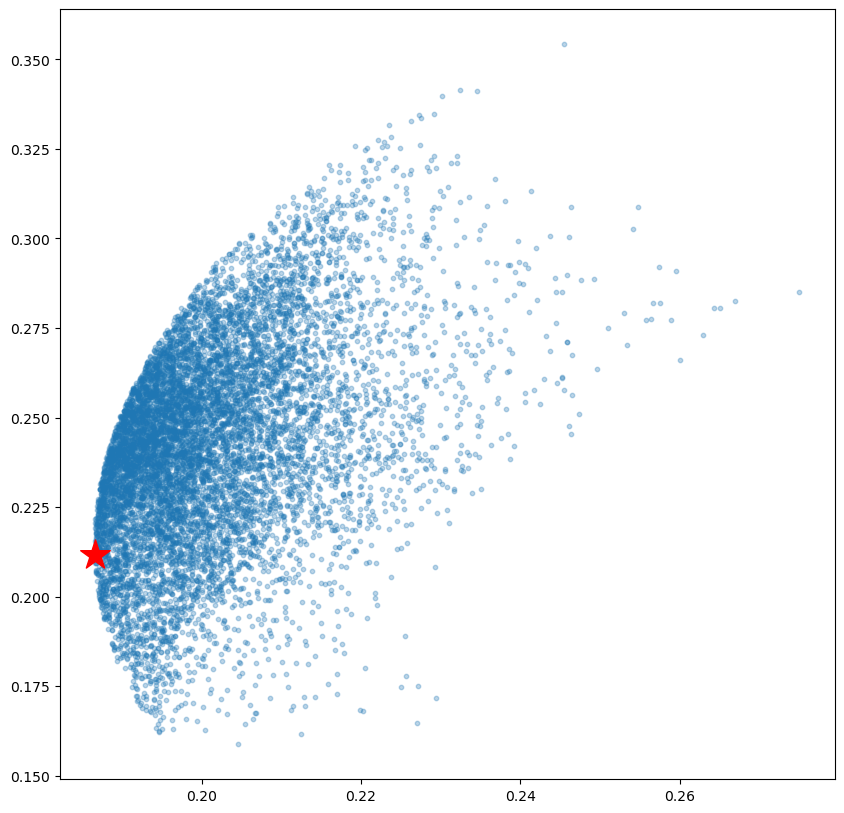

In [203]:
# plotting the minimum volatility portfolio
plt.subplots(figsize=[10,10])
plt.scatter(portfolios['Volatility'], portfolios['Returns'],marker='o', s=10, alpha=0.3)
plt.scatter(min_vol_port[1], min_vol_port[0], color='r', marker='*', s=500)

In [204]:
# Finding the optimal portfolio
rf = 0.01 # risk factor
optimal_risky_port = portfolios.iloc[((portfolios['Returns']-rf)/portfolios['Volatility']).idxmax()]
optimal_risky_port

Returns         0.325920
Volatility      0.219246
AAPL weight     0.725896
AMZN weight     0.164110
GOOGL weight    0.010004
NKE weight      0.099990
Name: 393, dtype: float64

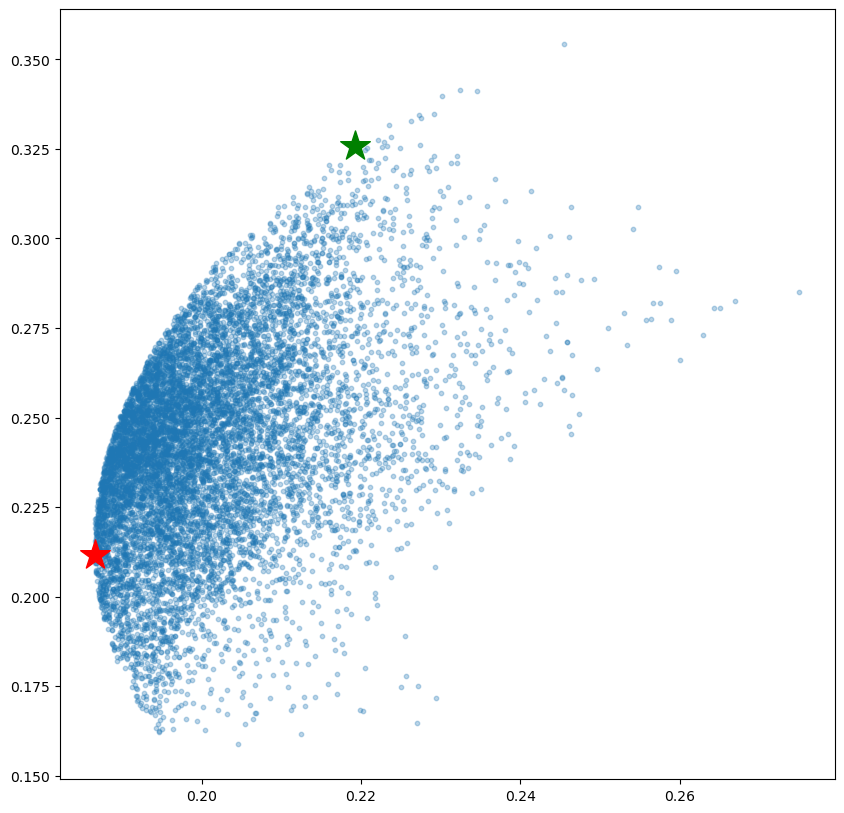

In [205]:
# Plotting optimal portfolio
plt.subplots(figsize=(10, 10))
plt.scatter(portfolios['Volatility'], portfolios['Returns'],marker='o', s=10, alpha=0.3)
plt.scatter(min_vol_port[1], min_vol_port[0], color='r', marker='*', s=500)
plt.scatter(optimal_risky_port[1], optimal_risky_port[0], color='g', marker='*', s=500)